In [127]:
import pandas as pd
import os.path
import PIL.ImageDraw
import glob
import ast

def f(x): 
    return ast.literal_eval(x.rstrip('\r\n'))

df = pd.read_csv("../sliced_images/quartered/annotaion/duplicate_Bb_annotation.csv", sep=";", converters={'geometry': f, 'bounds': f})
df

,image_id,geometry,class,bounds,width,height
0,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(135, 522), (245, 522), (245, 600), (135, 600...",Airplane,"(135, 522, 245, 600)",110,78
1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1025, 284), (1125, 284), (1125, 384), (1025,...",Airplane,"(1025, 284, 1125, 384)",100,100
2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1058, 1503), (1130, 1503), (1130, 1568), (10...",Airplane,"(1058, 1503, 1130, 1568)",72,65
3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(813, 1518), (885, 1518), (885, 1604), (813, ...",Airplane,"(813, 1518, 885, 1604)",72,86
4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(594, 938), (657, 938), (657, 1012), (594, 10...",Airplane,"(594, 938, 657, 1012)",63,74
...,...,...,...,...,...,...
3420,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(1059, 393), (1187, 393), (1187, 522), (1059,...",Airplane,"(1059, 393, 1187, 522)",128,129
3421,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(932, 355), (1028, 355), (1028, 461), (932, 4...",Airplane,"(932, 355, 1028, 461)",96,106
3422,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(2461, 244), (2560, 244), (2560, 345), (2461,...",Truncated_airplane,"(2461, 244, 2560, 345)",99,101
3423,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(1820, 344), (1937, 344), (1937, 443), (1820,...",Airplane,"(1820, 344, 1937, 443)",117,99


In [128]:
## find duplicate bounding boxes to delete

import math
from shapely.geometry import Polygon
index_list = []
for id in df["image_id"].unique():
    df_temp = df[df['image_id'] == id]
    for j, row in df_temp.iterrows():
        p1 = Polygon(df_temp['geometry'][j])
        for i, row in df_temp.iterrows():
            p2 = Polygon(df_temp['geometry'][i])
            if(p1.intersects(p2)):
                inter = p1.intersection(Polygon(df_temp['geometry'][i]))
                area = inter.area / p1.area 
                if(area > 0.75):
                    keep = []
                    if(p1.area < p2.area):
                       keep.append(j)

                    elif(p1.area > p2.area):
                       keep.append(i)
                    if(keep):
                        if keep[0] not in index_list:
                            index_list.append(keep[0])

In [129]:
len(index_list)

182

In [130]:
df = df.drop(df.index[index_list])
df.reset_index(inplace=True, drop=True)
df

,image_id,geometry,class,bounds,width,height
0,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(135, 522), (245, 522), (245, 600), (135, 600...",Airplane,"(135, 522, 245, 600)",110,78
1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1025, 284), (1125, 284), (1125, 384), (1025,...",Airplane,"(1025, 284, 1125, 384)",100,100
2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1058, 1503), (1130, 1503), (1130, 1568), (10...",Airplane,"(1058, 1503, 1130, 1568)",72,65
3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(813, 1518), (885, 1518), (885, 1604), (813, ...",Airplane,"(813, 1518, 885, 1604)",72,86
4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(594, 938), (657, 938), (657, 1012), (594, 10...",Airplane,"(594, 938, 657, 1012)",63,74
...,...,...,...,...,...,...
3238,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(1809, 1790), (1869, 1790), (1869, 1848), (18...",Airplane,"(1809, 1790, 1869, 1848)",60,58
3239,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(1760, 1878), (1828, 1878), (1828, 1936), (17...",Airplane,"(1760, 1878, 1828, 1936)",68,58
3240,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(1736, 1946), (1794, 1946), (1794, 2000), (17...",Airplane,"(1736, 1946, 1794, 2000)",58,54
3241,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(1059, 393), (1187, 393), (1187, 522), (1059,...",Airplane,"(1059, 393, 1187, 522)",128,129


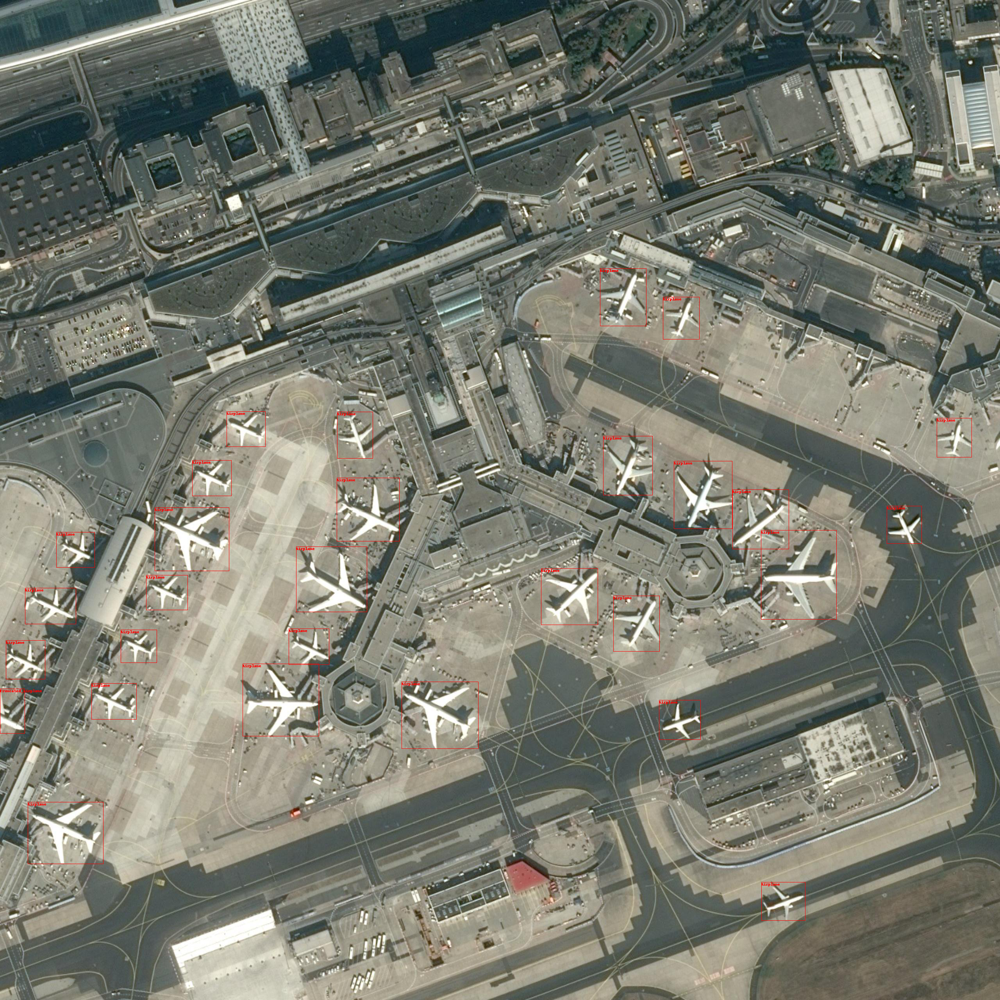

In [131]:
import os.path
import PIL.ImageDraw

pickone = '../../data_raw/images/fc1ab8ce-e531-46ed-b74b-0374cd58cf2a.jpg'
img = PIL.Image.open(pickone)
draw = PIL.ImageDraw.Draw(img)

for k, row in df[df['image_id'] == os.path.basename(pickone)].iterrows():
    draw.polygon(row['geometry'], outline=(255,0,0))
    draw.text(row['geometry'][0], row['class'], fill=(255,0,0))
    
display(img)

In [132]:
import pandas as pd
import numpy as np
from PIL import Image
from shapely.geometry import Polygon, Point
from matplotlib import pyplot as plt
import glob
import math

Image: ../../data_raw/images/90c365f8-18b6-4230-be74-cd856a1ba98f.jpg
Image: ../../data_raw/images/d3d2b706-9017-41f4-b57e-469038daa634.jpg
Image: ../../data_raw/images/e5416a97-a8ea-415f-928a-e75a5090cd46.jpg
Image: ../../data_raw/images/fc1ab8ce-e531-46ed-b74b-0374cd58cf2a.jpg


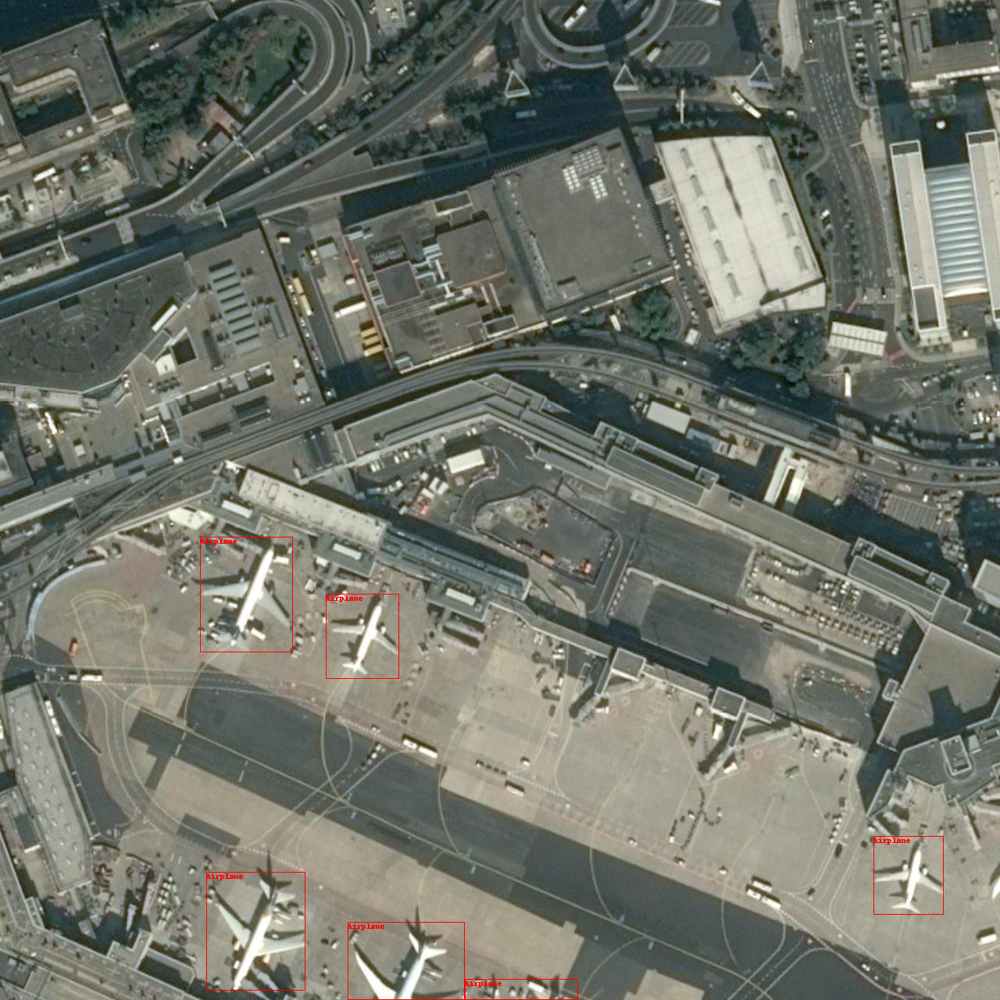

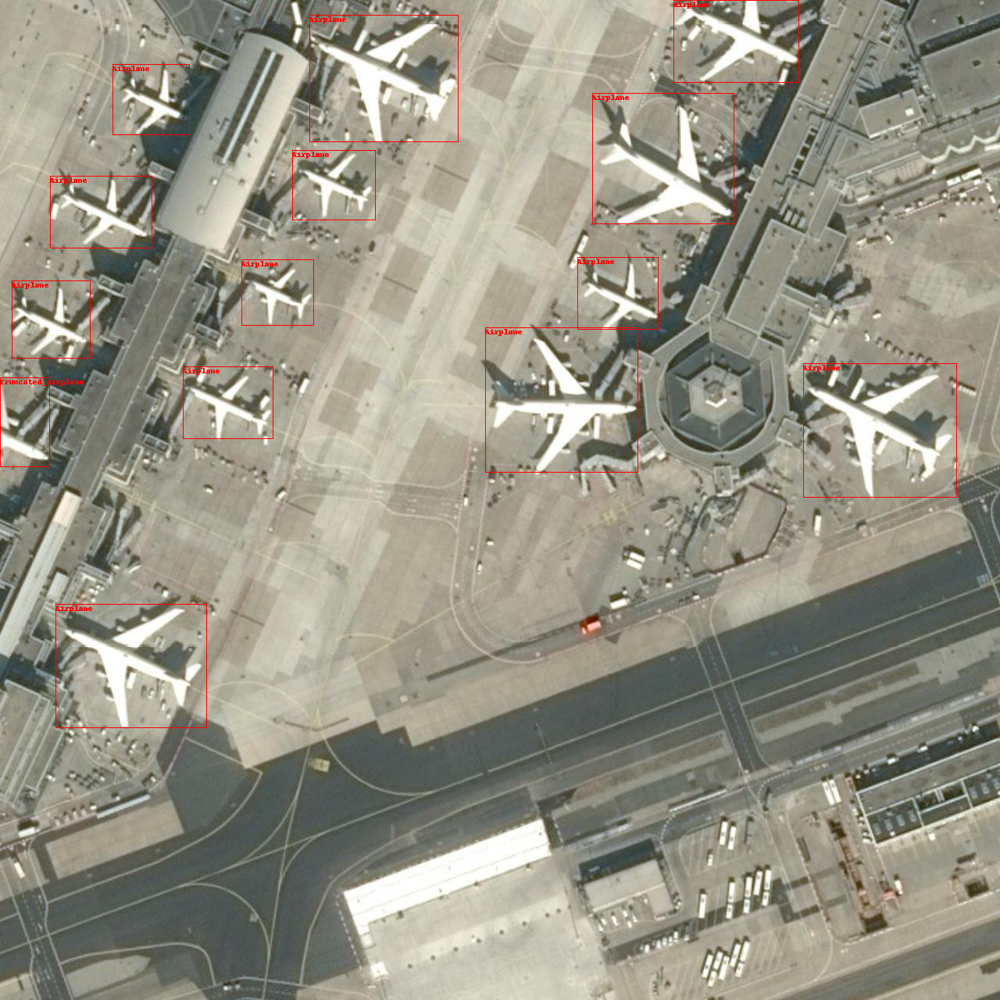

Image: ../../data_raw/images/38ff8d64-3460-4f83-bf9c-383832aeba0d.jpg
Image: ../../data_raw/images/0263270b-e3ee-41dc-aeef-43ff77e66d5b.jpg
Image: ../../data_raw/images/babb0ef2-ef2d-4cab-b3e2-230ae2418cdc.jpg
Image: ../../data_raw/images/eeb3f271-15f5-4977-a921-f4636efc6434.jpg
Image: ../../data_raw/images/4fdabd34-a2fd-4f0a-bb48-01fe043f1499.jpg
Image: ../../data_raw/images/9089631b-b1c0-4df8-b3f4-061c98149a94.jpg
Image: ../../data_raw/images/a40b7aed-8db8-449d-b0e4-3debfa04281a.jpg
Image: ../../data_raw/images/7c2da441-819f-4ddd-8293-f4be5213d69e.jpg
Image: ../../data_raw/images/576827bc-a94a-4611-8820-f3d56e969151.jpg
Image: ../../data_raw/images/11928d1c-44c7-4d3d-b593-9cdfd5f6f367.jpg
Image: ../../data_raw/images/ecfe7982-05e5-435f-824b-e24b6846316e.jpg
Image: ../../data_raw/images/cbd51501-ed0f-411c-b472-df4357cca40c.jpg
Image: ../../data_raw/images/7635d63c-6b97-4c9c-a7dc-27773d42ed4c.jpg
Image: ../../data_raw/images/d9399a45-6745-4e59-8903-90640b2ddf9f.jpg
Image: ../../data_ra

In [133]:
# get all image names
imnames = glob.glob('../../data_raw/images/*.jpg')

#imnames = glob.glob('../../data_raw/images/074737f4-7f59-4729-be5d-67f6f1d34668.jpg')

# specify path for a new tiled dataset
newpath = '../sliced_images/quartered/true/'
falsepath = '../sliced_images/quartered/false/'

# specify slice width=height
slice_size = 1280

df_res = pd.DataFrame(columns=["image_id", "geometry", "class", "bounds","width", "height"])

# tile all images in a loop

for imname in imnames:
    im = Image.open(imname)
    imr = np.array(im, dtype=np.uint8)
    height = imr.shape[0]
    width = imr.shape[1]

    labels = df[df['image_id'] == imname.split('/')[-1]]
    boxes = []
    # convert bounding boxes to shapely polygons. We need to invert Y and find polygon vertices from center points
    for index, row in labels.iterrows():
        
        x1, y1, x2, y2 = row["bounds"][0], row["bounds"][1], row["bounds"][2], row["bounds"][3]
        
       # x1 = row[1]['x1'] - row[1]['w']/2
       # y1 = (height - row[1]['y1']) - row[1]['h']/2
       # x2 = row[1]['x1'] + row[1]['w']/2
       # y2 = (height - row[1]['y1']) + row[1]['h']/2
        boxes.append((row['class'], Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])))
    
    counter = 0
    print('Image:', imname)
    # create tiles and find intersection with bounding boxes for each tile
    for i in range((height // slice_size)):
        for j in range((width // slice_size)):
            x1 = (j*slice_size)
            y1 = (i*slice_size)
            x2 = ((j+1)*slice_size) - 1
            y2 = ((i+1)*slice_size) - 1
                        
            pol = Polygon([(x1, y1), (x2, y1), (x2, y2), (x1, y2)])
            
            imsaved = False
            slice_labels = []
            slice_anno = []

            for box in boxes:
                if pol.intersects(box[1]):
                    inter = pol.intersection(box[1])   
                    if not imsaved:
                        sliced = imr[i*slice_size:(i+1)*slice_size, j*slice_size:(j+1)*slice_size]
                        sliced_im = Image.fromarray(sliced)
                        filename = imname.split('/')[-1]
                        new_filename = filename.replace('.jpg', f'_{i}_{j}.jpg')
                        slice_path = newpath + filename.replace('.jpg', f'_{i}_{j}.jpg')
                        
                        slice_labels_path = newpath + filename.replace('.jpg', f'_{i}_{j}.txt')
                        
                        #print(slice_path)
                        #sliced_im.save(slice_path)
                        imsaved = True                    
                    
                    # get the smallest polygon (with sides parallel to the coordinate axes) that contains the intersection
                    new_box = inter.envelope 
                    # get central point for the new bounding box 
                    centre = new_box.centroid
                    # get coordinates of polygon vertices
                    x, y = new_box.exterior.coords.xy
                    
                    # get bounding box width and height normalized to slice size
                    #new_width = (max(x) - min(x)) / slice_size
                    #new_height = (max(y) - min(y)) / slice_size
                    
                    
                    
                    # we have to normalize central x and invert y for yolo format
                    #new_x = (centre.coords.xy[0][0] - x1) / slice_size
                    #new_y = (y1 - centre.coords.xy[1][0]) / slice_size
                    
                    counter += 1

                    #slice_labels.append([box[0], new_x, new_y, new_width, new_height])
                    
                    
                    
                    min_x, max_x, min_y, max_y = math.ceil(min(x) - (j*slice_size)), math.ceil(max(x)- (j*slice_size)), math.ceil(min(y)- (i*slice_size)), math.ceil(max(y)- (i*slice_size))
                    slice_width, slice_height = max_x - min_x, max_y - min_y 
                    geometry = [(min_x, min_y), (max_x, min_y), (max_x, max_y), (min_x, max_y)]
                    bounds= (min_x, min_y, max_x, max_y)
                    
                    slice_anno.append([imname.split('/')[-1].replace('.jpg', f'_{i}_{j}.jpg'), geometry, box[0], bounds, slice_width, slice_height])
            
                    
            
            # save txt with labels for the current tile
            if len(slice_anno) > 0:
                #slice_df = pd.DataFrame(slice_labels, columns=['class', 'x1', 'y1', 'w', 'h'])
                #slice_df.to_csv(slice_labels_path, sep=' ', index=False, header=False, float_format='%.6f')
                
                df_anno = pd.DataFrame(slice_anno, columns=["image_id", "geometry", "class", "bounds","width", "height"])
                

                img = sliced_im
                draw = PIL.ImageDraw.Draw(img)

                for k, row in df_anno[df_anno['image_id'] == new_filename].iterrows():
                    draw.polygon(row['geometry'], outline=(255,0,0))
                    draw.text(row['geometry'][0], row['class'], fill=(255,0,0))

                if(new_filename == "fc1ab8ce-e531-46ed-b74b-0374cd58cf2a_0_1.jpg" or new_filename == "fc1ab8ce-e531-46ed-b74b-0374cd58cf2a_1_0.jpg"):
                    #print(df_anno[df_anno['image_id'] == new_filename])
                    display(img)
                
                